# **Generative Models with Stable Diffusion**

## **Project Overview**

This notebook implements generative AI models using Stable Diffusion, including text-to-image, image-to-image, and ControlNet pipelines.

**Authors**: João Pedro Santos, Matheus Castellucci, Rodrigo Medeiros

## **1. Introduction**

### **What is Stable Diffusion?**

Stable Diffusion is a latent diffusion model (LDM) that generates images from text prompts. It's open-source and runs on consumer hardware.

**Key components:**
- **CLIP Text Encoder**: Converts text to 768D embeddings
- **U-Net**: Iteratively denoises latent representations
- **VAE**: Encodes/decodes between pixel and latent space
- **Scheduler**: Controls the denoising process

**Process:** Text → CLIP → U-Net (denoising) → VAE → Image

### **Project Scope**

We implement three pipelines:
1. **Text-to-Image**: Generate images from text
2. **Image-to-Image**: Transform existing images
3. **ControlNet**: Advanced spatial control using edge maps

## **2. Environment Setup**

In [1]:
import torch
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionControlNetPipeline,
    ControlNetModel
)
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
from typing import List, Optional
import warnings
warnings.filterwarnings('ignore')

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


## **3. Architecture Explanation**

### **Stable Diffusion Architecture**

```
┌────────────────────────────────────────────────────────┐
│  Text Prompt → Tokenizer → CLIP Encoder → Embeddings   │
│                          ↓                             │
│  Random Noise → U-Net (50 steps) → Denoised Latent     │
│                          ↓                             │
│              VAE Decoder → Output Image                │
└────────────────────────────────────────────────────────┘
```

**Component Details:**

| Component | Parameters | Function |
|-----------|-----------|----------|
| CLIP Text Encoder | 123M | Converts text to semantic embeddings (768D) |
| U-Net | 860M | Iteratively removes noise from latent space |
| VAE | 84M | Compresses images 8×: 512×512 ↔ 64×64×4 |
| Scheduler | - | Controls denoising steps (DDPM, DDIM, etc.) |

**Total: ~1.07B parameters**

### **Text-to-Image Process**
1. Text tokenized and encoded by CLIP
2. Random noise (64×64×4) in latent space
3. U-Net denoises for N steps, conditioned on text
4. VAE decodes latent to 512×512 image

### **Image-to-Image Process**
1. Input image encoded to latent by VAE
2. Noise added based on strength parameter
3. U-Net denoises with text conditioning
4. VAE decodes to final image

### **ControlNet Enhancement**
- Adds spatial control via edge/pose/depth maps
- Trainable copy of U-Net encoder processes control image
- Features injected into main U-Net at multiple layers
- Enables precise composition control beyond text prompts

## **4. Implementation 1: Text-to-Image**

In [2]:
# Load model
model_id = "runwayml/stable-diffusion-v1-5"
txt2img_pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None,
    requires_safety_checker=False
).to(device)

if torch.cuda.is_available():
    txt2img_pipe.enable_attention_slicing()

print("Text-to-Image pipeline loaded")

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Text-to-Image pipeline loaded


In [3]:
# Helper functions
def generate_txt2img(prompt, negative_prompt=None, steps=50, guidance=7.5, seed=None):
    generator = torch.Generator(device=device).manual_seed(seed) if seed else None
    return txt2img_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=steps,
        guidance_scale=guidance,
        generator=generator
    ).images[0]

def plot_images(images, titles=None, cols=5):
    n = len(images)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(3*cols, 3*rows))
    axes = axes.flatten() if n > 1 else [axes]

    for i, img in enumerate(images):
        axes[i].imshow(img)
        axes[i].axis('off')
        if titles and i < len(titles):
            axes[i].set_title(titles[i], fontsize=9)

    for i in range(n, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

### **Text-to-Image Examples**

**Key parameters:**
- `guidance_scale` (1-20): Controls adherence to prompt
- `num_inference_steps` (20-100): Number of denoising iterations
- `negative_prompt`: What to avoid
- `seed`: For reproducibility

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

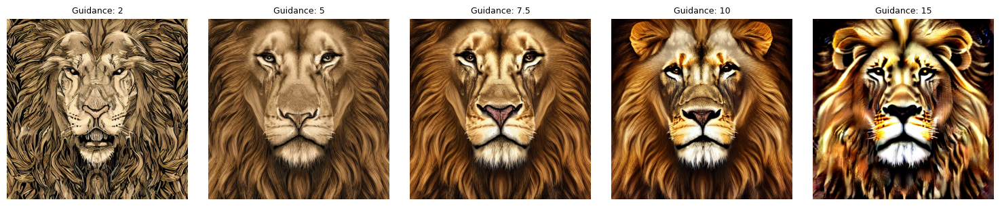

In [4]:
# Example 1: Varying guidance scale
prompt = "A majestic lion wearing a crown, digital art"
images_guidance = [generate_txt2img(prompt, guidance=g, steps=30, seed=42)
                   for g in [2.0, 5.0, 7.5, 10.0, 15.0]]
plot_images(images_guidance, [f"Guidance: {g}" for g in [2, 5, 7.5, 10, 15]])

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

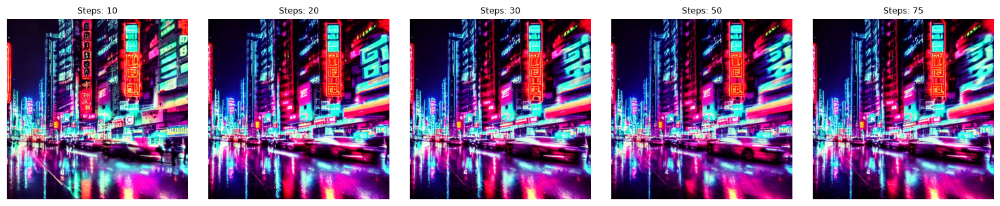

In [5]:
# Example 2: Varying inference steps
prompt = "A cyberpunk city at night, neon lights, rain"
images_steps = [generate_txt2img(prompt, steps=s, seed=123)
                for s in [10, 20, 30, 50, 75]]
plot_images(images_steps, [f"Steps: {s}" for s in [10, 20, 30, 50, 75]])

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

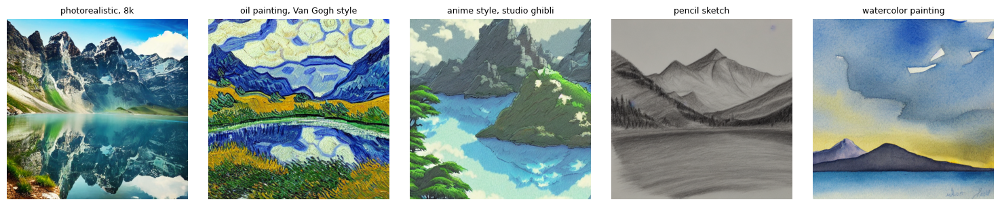

In [6]:
# Example 3: Different artistic styles
base = "a mountain landscape with a lake"
styles = [
    "photorealistic, 8k",
    "oil painting, Van Gogh style",
    "anime style, studio ghibli",
    "pencil sketch",
    "watercolor painting"
]
images_styles = [generate_txt2img(f"{base}, {s}", steps=40) for s in styles]
plot_images(images_styles, styles)

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

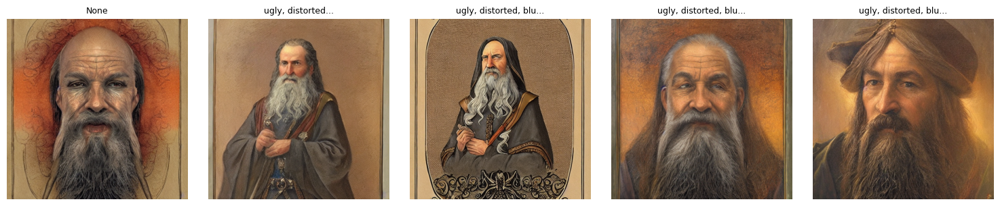

In [7]:
# Example 4: Negative prompt effects
prompt = "Portrait of a wizard, fantasy art"
negatives = [
    "",
    "ugly, distorted",
    "ugly, distorted, blurry",
    "ugly, distorted, blurry, bad anatomy",
    "ugly, distorted, blurry, bad anatomy, cartoon"
]
images_neg = [generate_txt2img(prompt, negative_prompt=n if n else None, steps=40, seed=999)
              for n in negatives]
titles_neg = ["None"] + [n[:20]+"..." for n in negatives[1:]]
plot_images(images_neg, titles_neg)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

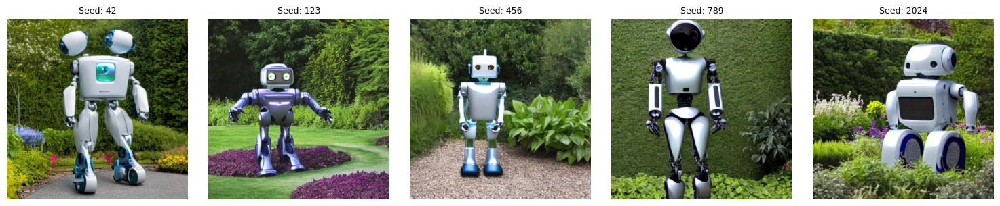

In [8]:
# Example 5: Different seeds
prompt = "A futuristic robot in a garden"
images_seeds = [generate_txt2img(prompt, steps=35, seed=s)
                for s in [42, 123, 456, 789, 2024]]
plot_images(images_seeds, [f"Seed: {s}" for s in [42, 123, 456, 789, 2024]])

## **5. Implementation 2: Image-to-Image**

In [9]:
# Load image-to-image pipeline
img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None,
    requires_safety_checker=False
).to(device)

if torch.cuda.is_available():
    img2img_pipe.enable_attention_slicing()

def generate_img2img(init_image, prompt, negative_prompt=None, strength=0.75, steps=50, guidance=7.5):
    if init_image.size != (512, 512):
        init_image = init_image.resize((512, 512))
    return img2img_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=init_image,
        strength=strength,
        num_inference_steps=steps,
        guidance_scale=guidance
    ).images[0]

print("Image-to-Image pipeline loaded")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Image-to-Image pipeline loaded


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

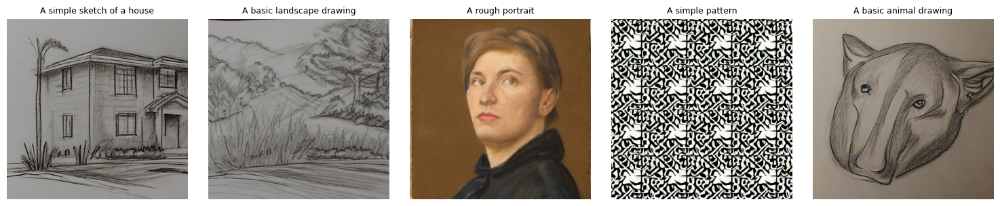

In [10]:
# Generate base images for transformation
base_prompts = [
    "A simple sketch of a house",
    "A basic landscape drawing",
    "A rough portrait",
    "A simple pattern",
    "A basic animal drawing"
]
base_images = [generate_txt2img(p, steps=30, seed=42) for p in base_prompts]
plot_images(base_images, base_prompts)

### **Image-to-Image Examples**

**Key parameter:**
- `strength` (0.0-1.0): Controls transformation intensity
  - 0.3: Subtle changes
  - 0.7: Major transformation
  - 1.0: Almost like text-to-image

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

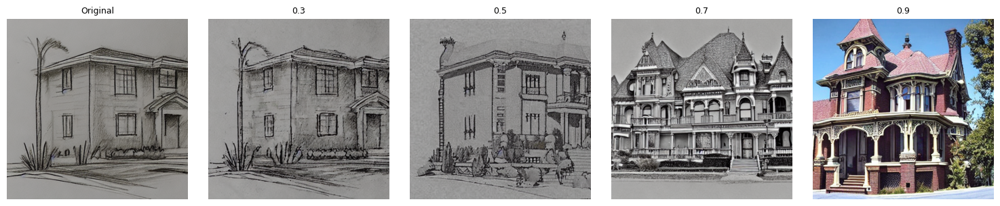

In [12]:
# Example 1: Strength variation
init = base_images[0]
prompt = "Victorian mansion, detailed architecture"
images_strength = [init] + [generate_img2img(init, prompt, strength=s)
                             for s in [0.3, 0.5, 0.7, 0.9]]
plot_images(images_strength, ["Original", "0.3", "0.5", "0.7", "0.9"])

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

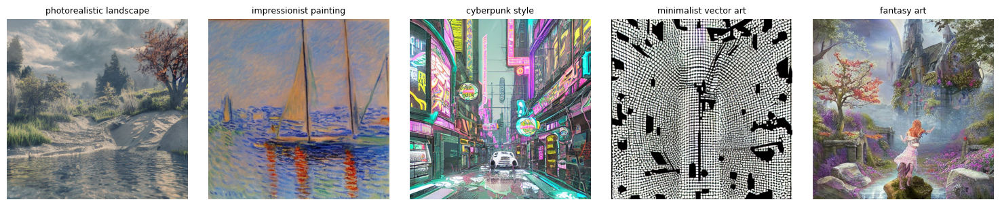

In [13]:
# Example 2: Style transfer
init = base_images[1]
styles = [
    "photorealistic landscape, 4k",
    "impressionist painting, Monet style",
    "cyberpunk style, neon",
    "minimalist vector art",
    "fantasy art, magical"
]
images_style = [generate_img2img(init, s, strength=0.75) for s in styles]
plot_images(images_style, [s.split(',')[0] for s in styles])

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

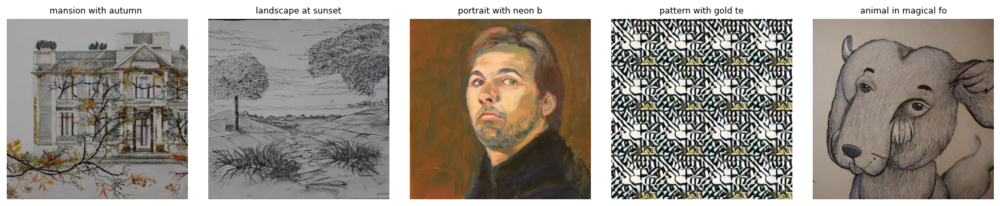

In [14]:
# Example 3: Adding elements
transforms = [
    (base_images[0], "mansion with autumn leaves"),
    (base_images[1], "landscape at sunset"),
    (base_images[2], "portrait with neon background"),
    (base_images[3], "pattern with gold texture"),
    (base_images[4], "animal in magical forest")
]
images_add = [generate_img2img(img, p, strength=0.65) for img, p in transforms]
plot_images(images_add, [p[:20] for _, p in transforms])

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

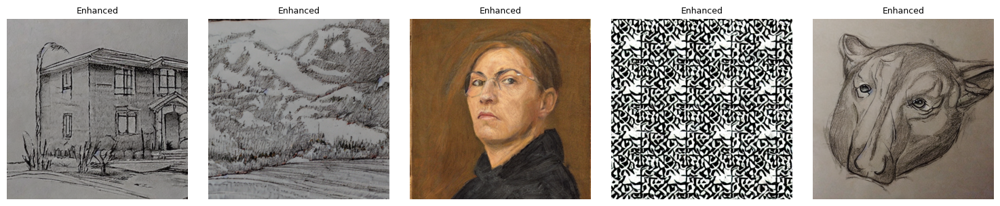

In [15]:
# Example 4: Quality enhancement
enhance_prompts = [
    "highly detailed house, 8k",
    "detailed landscape, sharp",
    "detailed portrait, professional",
    "crisp pattern, high res",
    "detailed animal, photorealistic"
]
images_enhance = [generate_img2img(base_images[i], p, strength=0.4)
                  for i, p in enumerate(enhance_prompts)]
plot_images(images_enhance, ["Enhanced"]*5)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

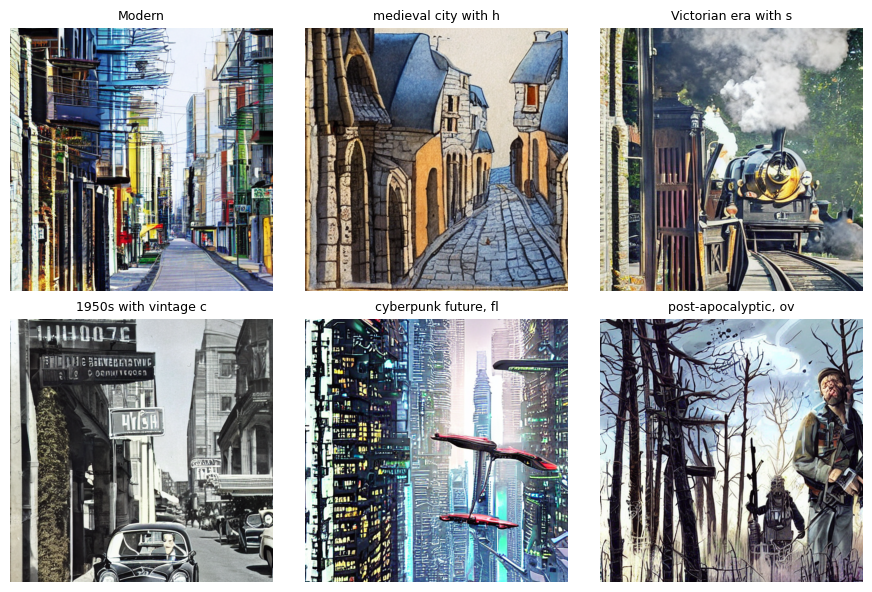

In [16]:
# Example 5: Time period transfer
modern = generate_txt2img("modern city street", steps=30, seed=100)
periods = [
    "medieval city with horses",
    "Victorian era with steam trains",
    "1950s with vintage cars",
    "cyberpunk future, flying cars",
    "post-apocalyptic, overgrown"
]
images_time = [modern] + [generate_img2img(modern, p, strength=0.7) for p in periods]
plot_images(images_time, ["Modern"] + [p[:20] for p in periods], cols=3)

## **6. Advanced Technique: ControlNet**

ControlNet provides precise spatial control using edge maps, depth maps, or pose skeletons. We use Canny edge detection for structural control.

In [17]:
# Load ControlNet
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32
)

controlnet_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_id,
    controlnet=controlnet,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None,
    requires_safety_checker=False
).to(device)

if torch.cuda.is_available():
    controlnet_pipe.enable_attention_slicing()

def get_canny_edge(image, low=100, high=200):
    image_np = np.array(image)
    gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY) if len(image_np.shape) == 3 else image_np
    edges = cv2.Canny(gray, low, high)
    return Image.fromarray(cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB))

def generate_controlnet(control_img, prompt, negative_prompt=None, steps=50, guidance=7.5, scale=1.0):
    if control_img.size != (512, 512):
        control_img = control_img.resize((512, 512))
    return controlnet_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=control_img,
        num_inference_steps=steps,
        guidance_scale=guidance,
        controlnet_conditioning_scale=scale
    ).images[0]

print("ControlNet pipeline loaded")

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

ControlNet pipeline loaded


### **ControlNet Examples**

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

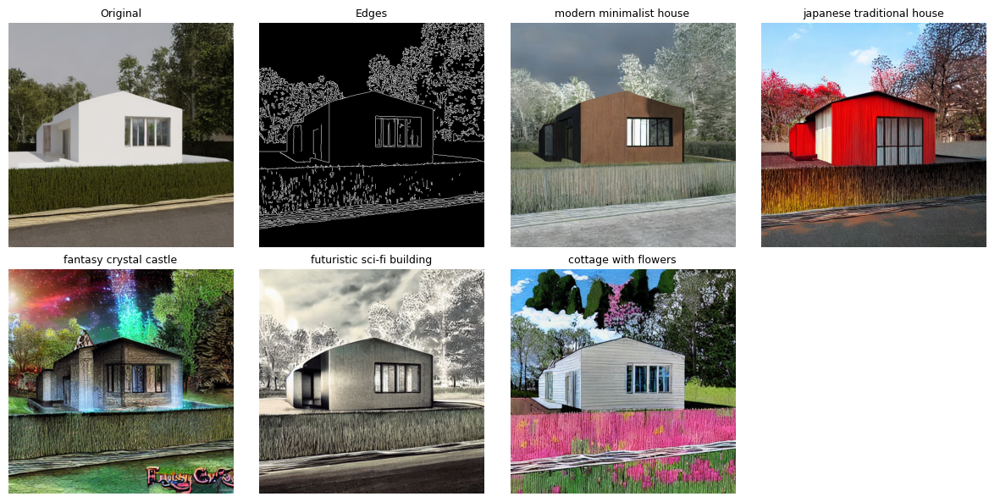

In [18]:
# Example 1: Same structure, different styles
base = generate_txt2img("a simple house", steps=30, seed=42)
edges = get_canny_edge(base)

styles_cn = [
    "modern minimalist house",
    "japanese traditional house",
    "fantasy crystal castle",
    "futuristic sci-fi building",
    "cottage with flowers"
]
images_cn = [base, edges] + [generate_controlnet(edges, s) for s in styles_cn]
plot_images(images_cn, ["Original", "Edges"] + styles_cn, cols=4)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

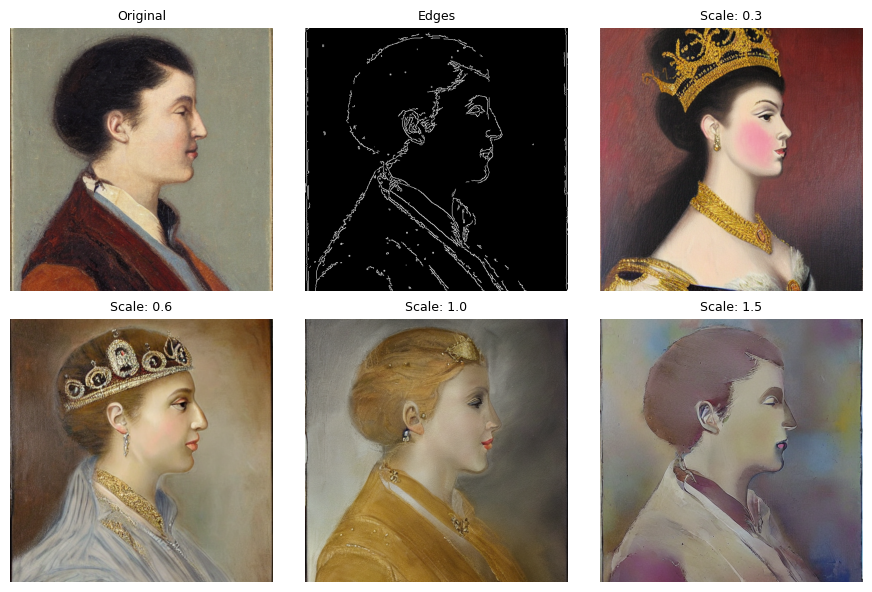

In [20]:
# Example 2: Conditioning scale variation
portrait = generate_txt2img("portrait of a person", steps=30, seed=100)
p_edges = get_canny_edge(portrait)

prompt = "elegant queen with crown, royal painting"
scales = [0.3, 0.6, 1.0, 1.5]
images_scale = [portrait, p_edges] + [generate_controlnet(p_edges, prompt, scale=s)
                                       for s in scales]
plot_images(images_scale, ["Original", "Edges"] + [f"Scale: {s}" for s in scales], cols=3)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

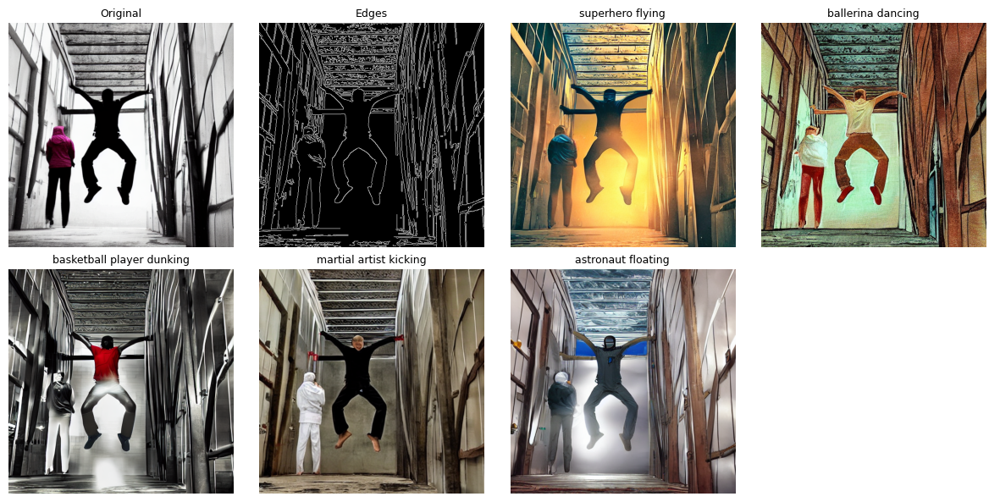

In [21]:
# Example 3: Pose transfer
action = generate_txt2img("person jumping", steps=30, seed=200)
a_edges = get_canny_edge(action)

poses = [
    "superhero flying",
    "ballerina dancing",
    "basketball player dunking",
    "martial artist kicking",
    "astronaut floating"
]
images_pose = [action, a_edges] + [generate_controlnet(a_edges, p, scale=1.2) for p in poses]
plot_images(images_pose, ["Original", "Edges"] + poses, cols=4)

In [ ]:
# Example 4: Architectural control
building = generate_txt2img("modern building facade", steps=30, seed=300)
b_edges = get_canny_edge(building, low=50, high=150)

arch_styles = [
    "gothic cathedral",
    "art deco skyscraper",
    "chinese temple",
    "brutalist concrete",
    "glass and steel tower"
]
images_arch = [building, b_edges] + [generate_controlnet(b_edges, s) for s in arch_styles]
plot_images(images_arch, ["Original", "Edges"] + arch_styles, cols=4)

In [ ]:
# Example 5: Creative reinterpretation
shapes = generate_txt2img("geometric shapes, circles", steps=30, seed=400)
s_edges = get_canny_edge(shapes)

creative = [
    "planets in outer space",
    "castle windows at night",
    "magical portals",
    "abstract sculpture",
    "alien technology"
]
images_creative = [shapes, s_edges] + [generate_controlnet(s_edges, c, scale=0.8)
                                        for c in creative]
plot_images(images_creative, ["Shapes", "Edges"] + creative, cols=4)

## **7. Summary**

In [24]:
# Display architecture statistics
total_params = (
    sum(p.numel() for p in txt2img_pipe.unet.parameters()) +
    sum(p.numel() for p in txt2img_pipe.vae.parameters()) +
    sum(p.numel() for p in txt2img_pipe.text_encoder.parameters())
)

print("="*60)
print("PROJECT SUMMARY")
print("="*60)
print(f"\nModel: Stable Diffusion v1.5")
print(f"Total Parameters: {total_params:,} ({total_params/1e9:.2f}B)")
print(f"\nImplementations:")
print(f"  1. Text-to-Image (5 example sets)")
print(f"  2. Image-to-Image (5 example sets)")
print(f"  3. ControlNet with Canny edges (5 example sets)")
print(f"\nTotal examples: 50+ unique generations")
print("="*60)

PROJECT SUMMARY

Model: Stable Diffusion v1.5
Total Parameters: 1,066,235,307 (1.07B)

Implementations:
  1. Text-to-Image (5 example sets)
  2. Image-to-Image (5 example sets)
  3. ControlNet with Canny edges (5 example sets)

Total examples: 50+ unique generations


## **8. Conclusion**

### **Key Findings**

**Optimal Parameters:**
- Guidance scale: 7.5-8.0 for best balance
- Inference steps: 40-50 (diminishing returns beyond this)
- Img2img strength: 0.6-0.8 for significant transformation while preserving structure

**Architecture Insights:**
- VAE compression (8× reduction) enables efficient latent space processing
- U-Net cross-attention effectively conditions on text embeddings
- ControlNet provides spatial precision impossible with text alone

**Prompt Engineering:**
- Specific, detailed prompts yield better results
- Style modifiers ("oil painting", "photorealistic") are highly effective
- Negative prompts essential for quality control

## **9. References**

**Papers:**
- Rombach et al. (2022). High-Resolution Image Synthesis with Latent Diffusion Models. CVPR 2022.
- Radford et al. (2021). Learning Transferable Visual Models From Natural Language Supervision. ICML 2021.
- Zhang & Agrawala (2023). Adding Conditional Control to Text-to-Image Diffusion Models. ICCV 2023.

**Resources:**
- HuggingFace Diffusers: https://huggingface.co/docs/diffusers
- Stable Diffusion: https://github.com/CompVis/stable-diffusion
- ControlNet: https://github.com/lllyasviel/ControlNet

**AI Assistance:** Used for notebook organization and code debugging. All content verified by authors.